In [1]:
%cd ../../../fake-profile-detection

f:\Projects\fake-profile-detection


In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [3]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
stopwords = set(STOPWORDS)

## Graph output settings

In [4]:
file_extension = 'pdf'
OUTPATH = './output/tweet-mib-1/'
output_path = lambda name: f'{OUTPATH}{name}.{file_extension}'
dpi = 100

#save fig option
save_fig = True

# Preprocessing

In [5]:
from src.eda_pipeline import EDAPipeline
pipe = EDAPipeline(use_tweet=True)
pipe.get_data('MIB')

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
pipe.dfs.keys()

dict_keys(['user_df', 'tweet_metadata_df', 'tweet_df'])

In [8]:
import re
def isAllCaps(word):
    for c in word:
        if c.islower() or not c.isalpha():
            return False
    return True

def hasRepeatedLetters(word):
    prev = ''
    prev2 = ''
    for c in word:
        if c == prev:
            if c == prev2:
                return True
        prev2 = prev
        prev = c
    return False
def text_tags(row):
    URL_PATTERN = r"[(http(s)?):\/\/(www\.)?a-zA-Z0-9@:%._\+~#=]{2,256}\.[a-z]{2,6}\b([-a-zA-Z0-9@:%_\+.~#?&//=]*)"
    rowlist = str(row).split()
    rowlist = [word.strip() for word in rowlist]
    rowlist = [word if not word.strip().startswith(
        '#') else "hashtagtag" for word in rowlist]
    rowlist = [word if not word.strip().startswith(
        '@') else "usertag" for word in rowlist]
    rowlist = [word if not isAllCaps(
        word.strip()) else word.lower() + " allcapstag" for word in rowlist]
    rowlist = [word if not hasRepeatedLetters(
        word.strip()) else word + " repeatedtag" for word in rowlist]
    rowlist = [word.lower() for word in rowlist]
    rowlist = [re.sub(URL_PATTERN, "urltag", word) for word in rowlist]
    return " ".join(rowlist)


In [9]:
df = pipe.dfs['tweet_df']
df["text"] = df["text"].apply(text_tags)

In [10]:
import tensorflow as tf
tokenizer = tf.keras.preprocessing.text.Tokenizer()
tokenizer.fit_on_texts(df["text"])

In [11]:
word_index = tokenizer.__dict__['word_index']
wordcloud = WordCloud(width = 1600, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate_from_frequencies(word_index)

<Figure size 1152x576 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

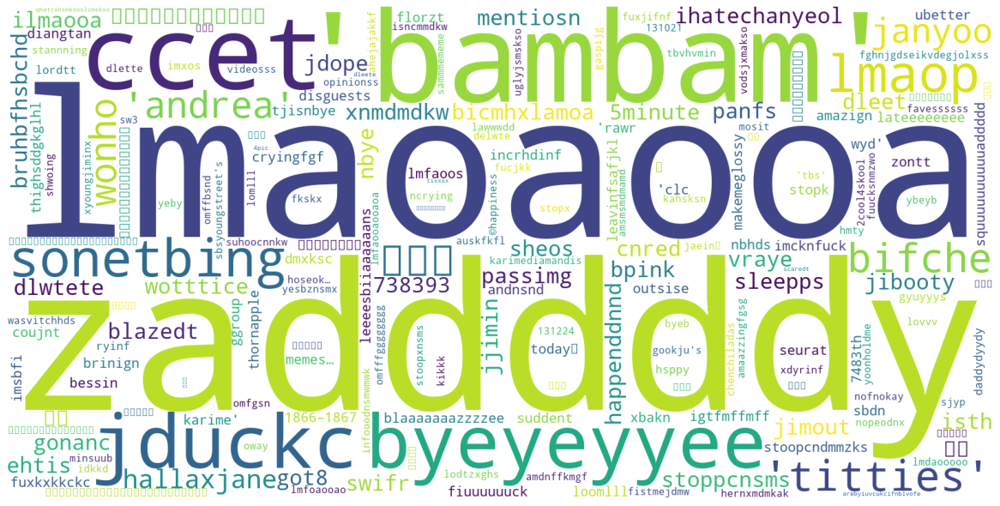

In [12]:
# plot the WordCloud image                      
plt.figure(figsize = (16, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
if save_fig: plt.savefig(output_path("wcloud_full"), dpi=dpi)
plt.show()

In [13]:
word_df = pd.DataFrame.from_dict(word_index, orient='index', columns=['freq'])
word_df.head(10)

,freq
allcapstag,1
usertag,2
the,3
urltag,4
rt,5
a,6
i,7
to,8
hashtagtag,9
you,10


In [14]:
word_df = word_df.sort_values(by='freq', ascending=False)
word_df.head(10)

,freq
lmaoaooa,1635966
zadddddy,1635965
'bambam',1635964
ccet,1635963
byeyeyyee,1635962
jduckc,1635961
sonetbing,1635960
lmaop,1635959
'titties',1635958
꽃지호,1635957


## Helpers

In [15]:
def plot_wordcloud(df, outname = 'UNKNOWN', preprocess = False):
    if preprocess:
        df["text"] = df["text"].apply(text_tags)

    # tokenize
    tokenizer = tf.keras.preprocessing.text.Tokenizer()
    tokenizer.fit_on_texts(df["text"])

    # gen wcloud
    word_index = tokenizer.__dict__['word_index']
    wordcloud = WordCloud(width = 1600, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate_from_frequencies(word_index)
    
    # plot the WordCloud image                      
    plt.figure(figsize = (16, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    if save_fig: plt.savefig(output_path(outname), dpi=dpi)
    plt.show()

def split_by_label(df):
    is_bot = df['label'] == 1
    return df[is_bot], df[~is_bot]

## Cloud by label

In [16]:
df['label'].unique()

array([1, 0], dtype=int64)

In [17]:
df_bot, df_human = split_by_label(df)

Full Bot


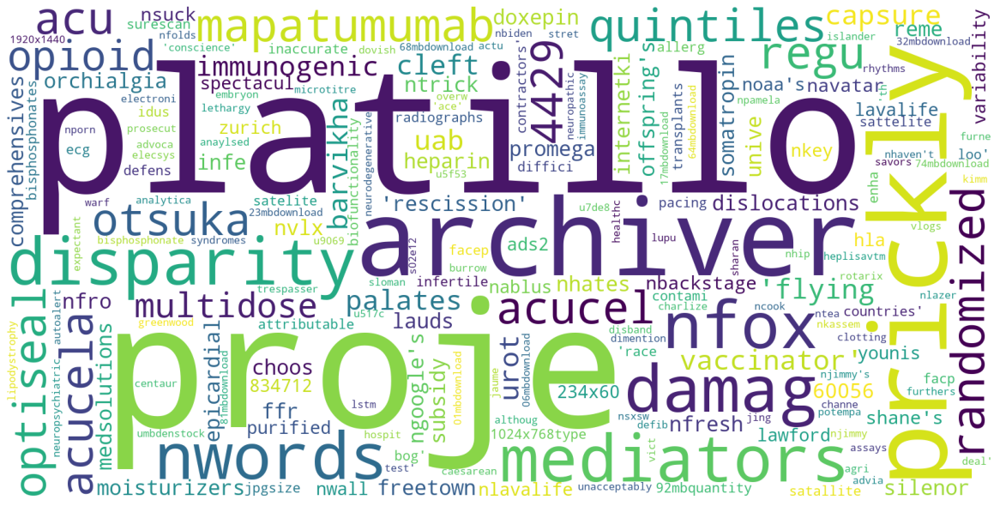

Full Human


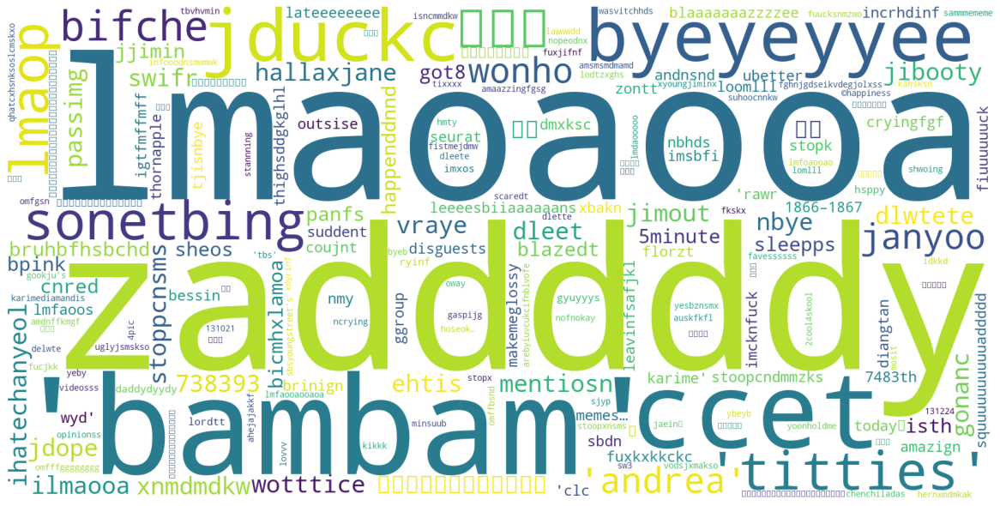

In [18]:
print('Full Bot')
plot_wordcloud(df_bot, 'wcloud_full_bot')
print('Full Human')
plot_wordcloud(df_human, 'wcloud_full_human')

# Cloud by lang

In [19]:
df_user = pipe.dfs['user_df']
df_tweet_lang = df.merge(df_user[['id', 'lang']], left_on='user_id', right_on='id')

In [20]:
df_tweet_lang.shape
df.shape

(11979749, 5)

(11979749, 3)

Language:  it


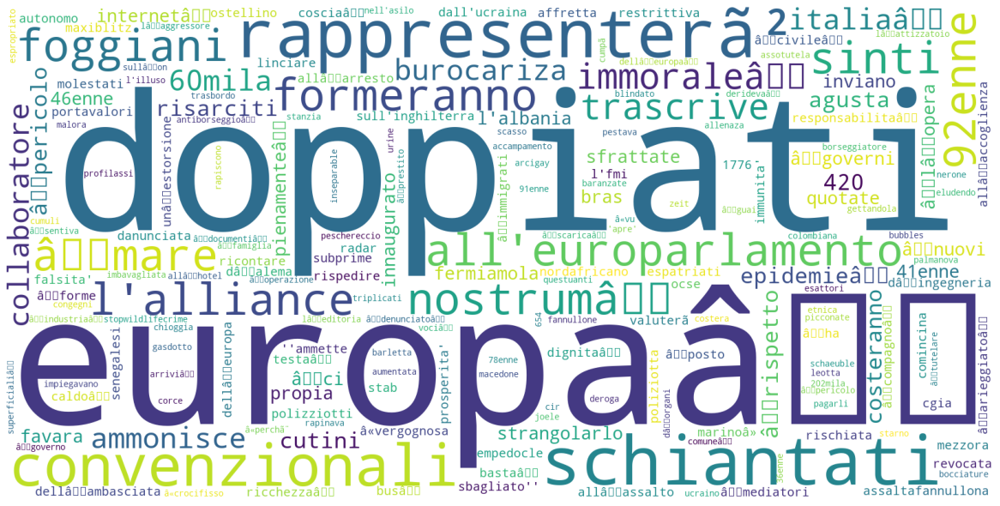

Language:  en


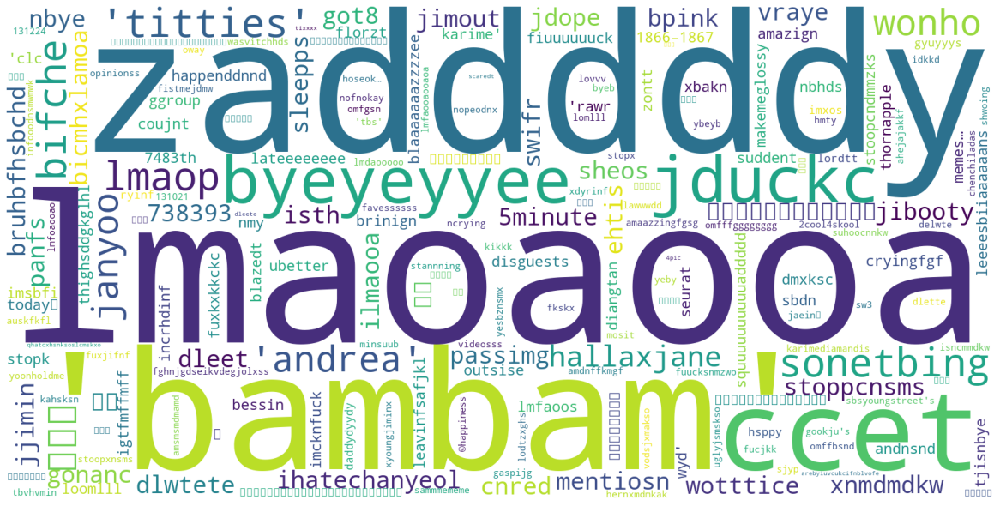

Language:  de


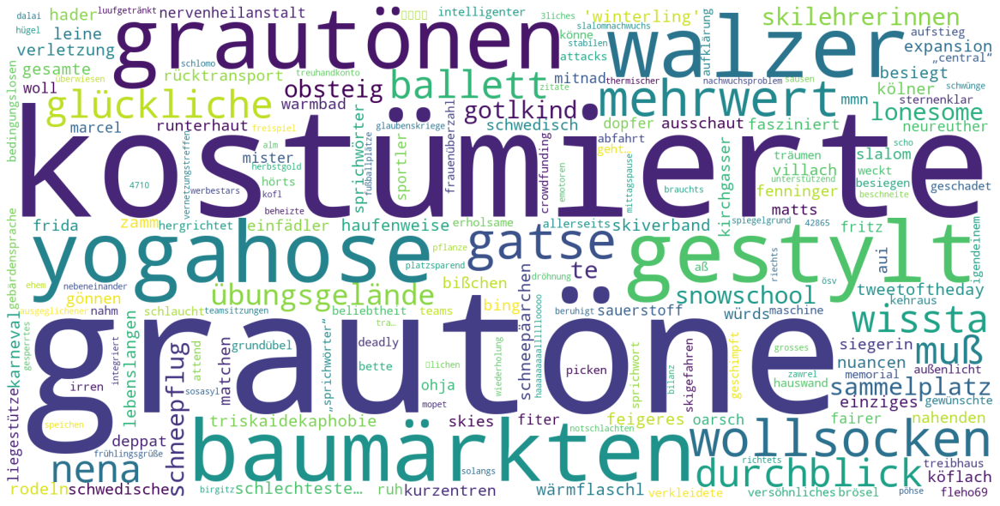

Language:  ja


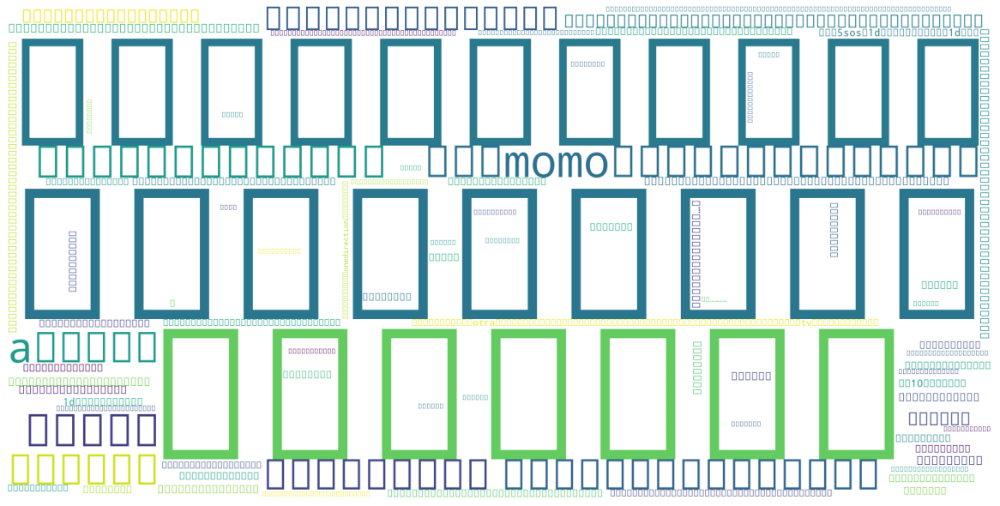

Language:  ru


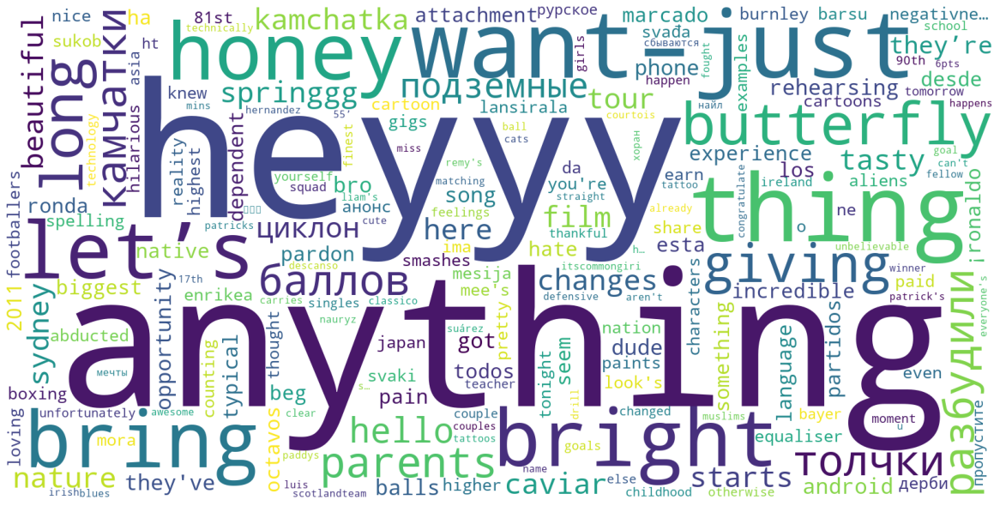

Language:  nl


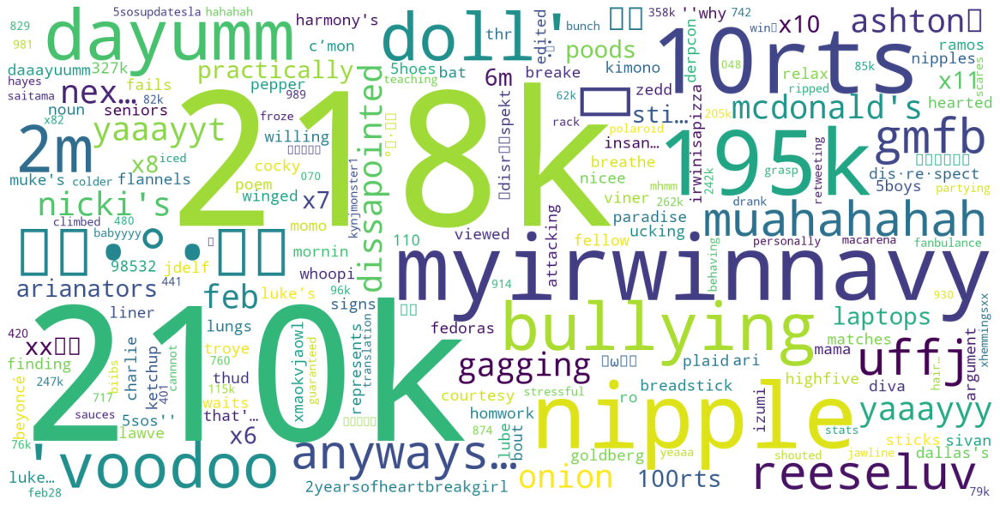

Language:  en-gb


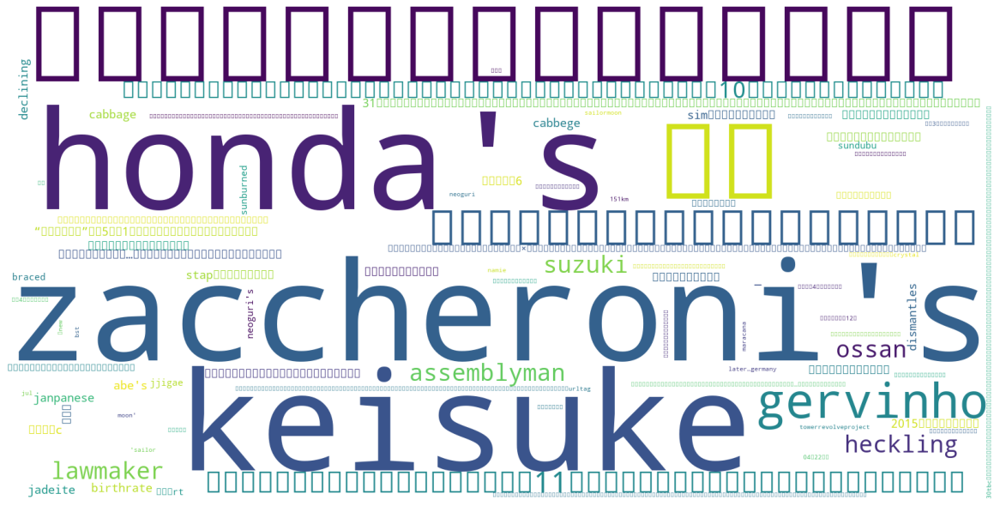

Language:  pt


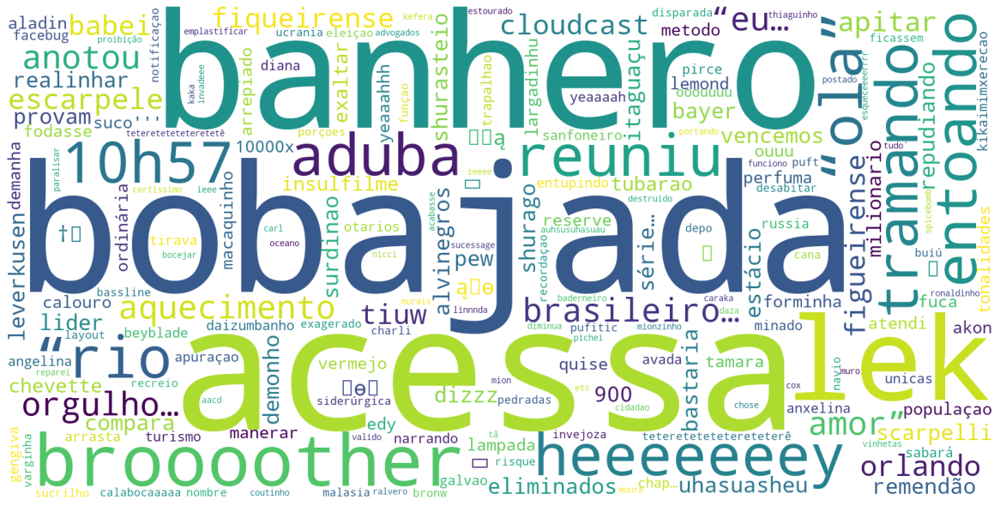

Language:  nan
Language:  es


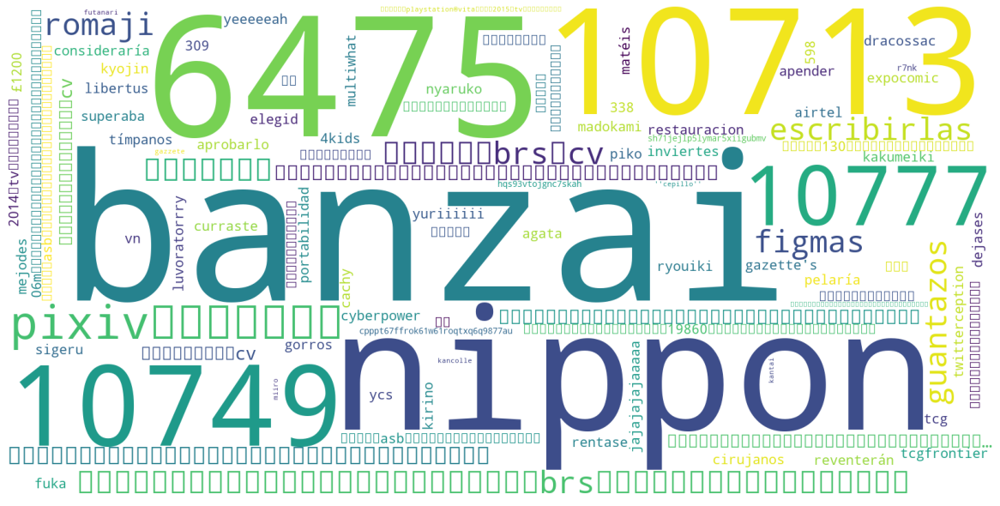

Language:  sv


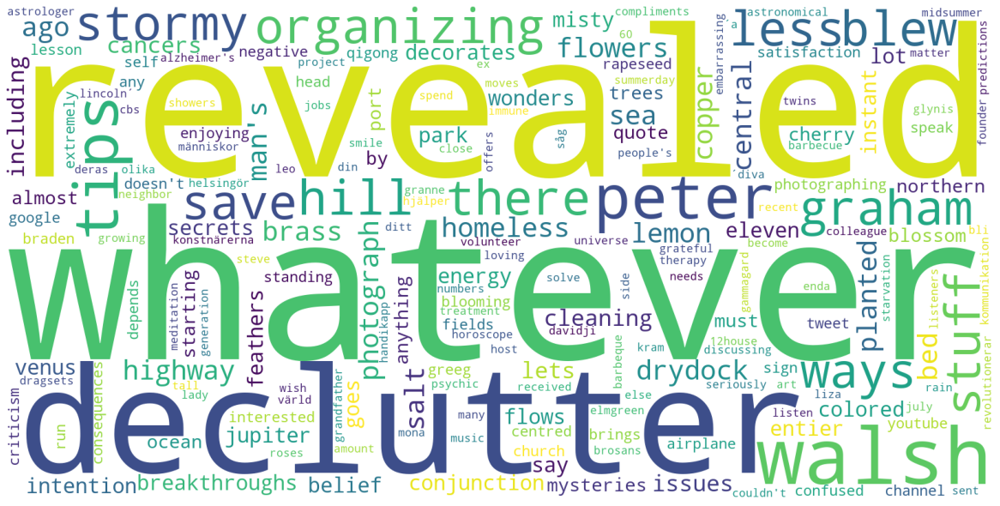

Language:  fr


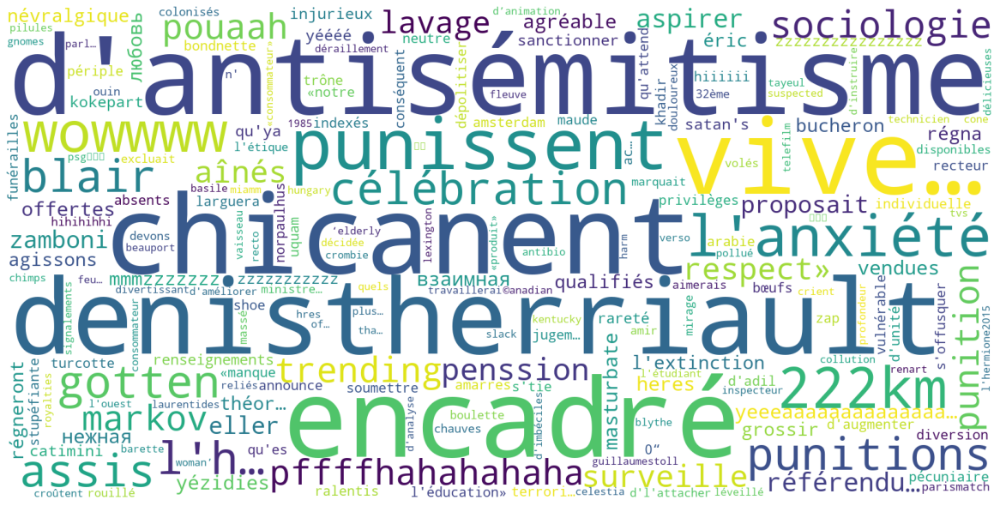

Language:  en-GB


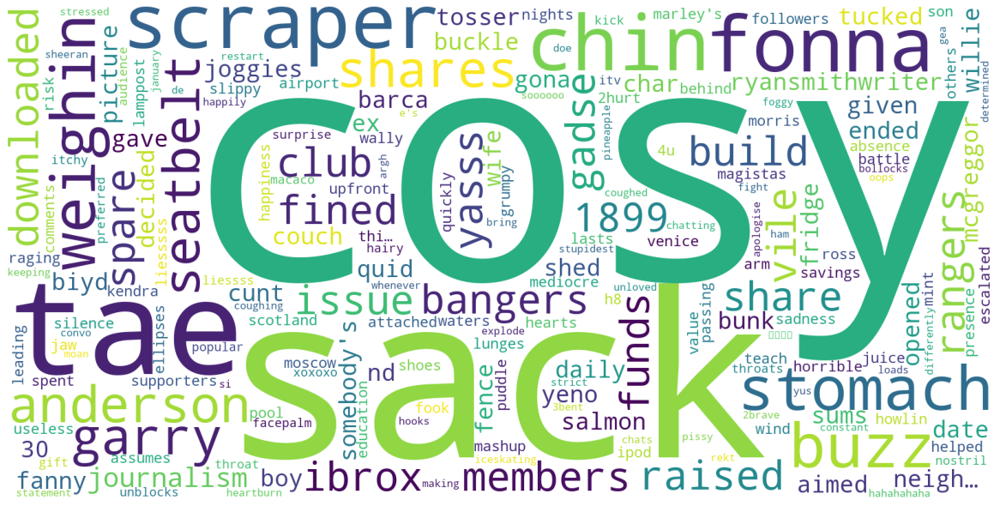

Language:  pl


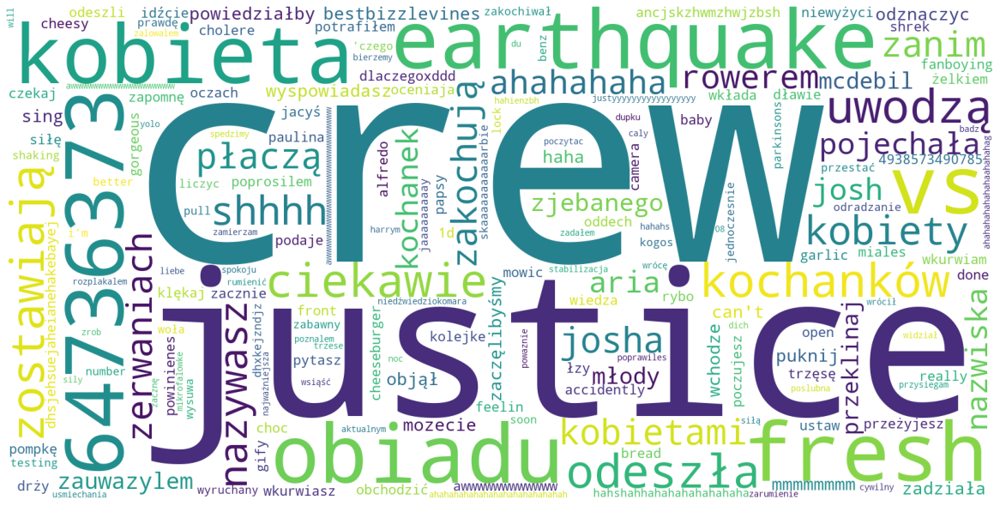

Language:  zh-tw


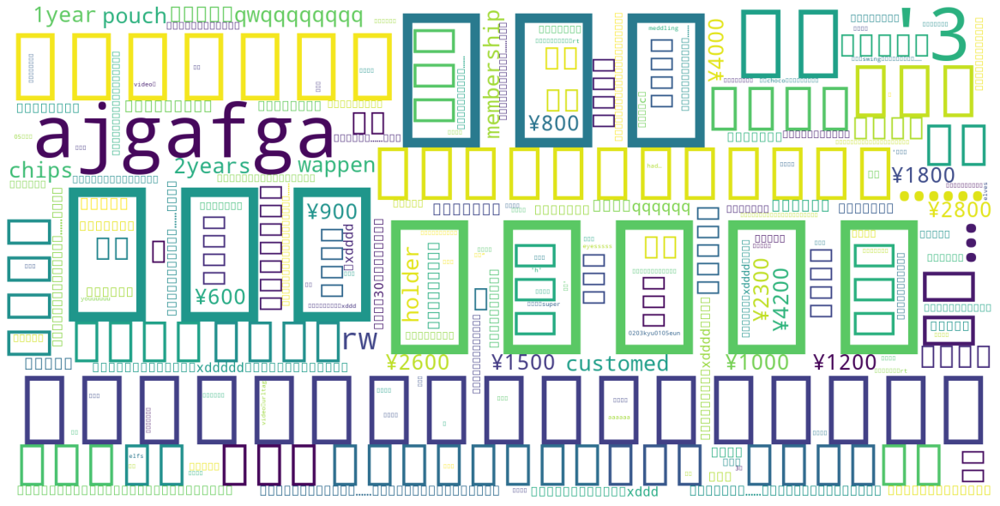

Language:  xx-lc


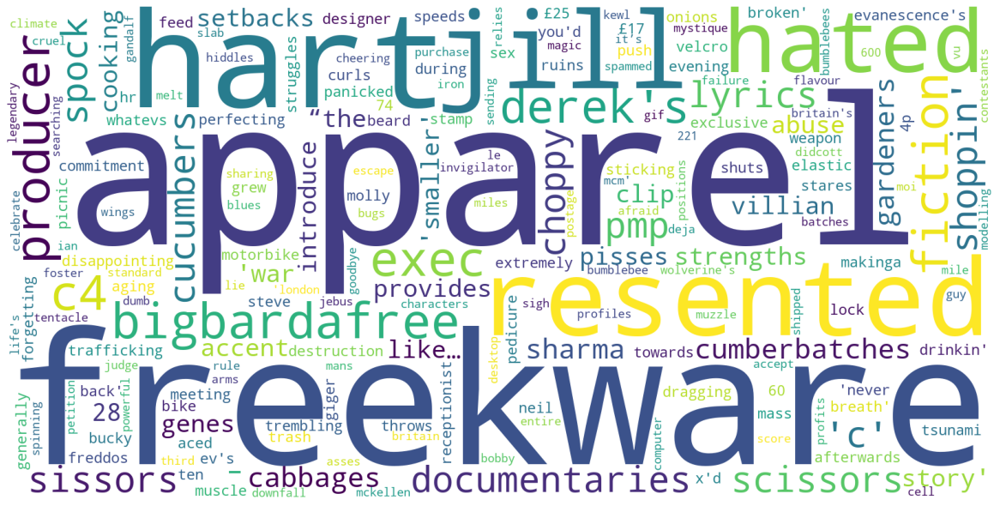

Language:  tr


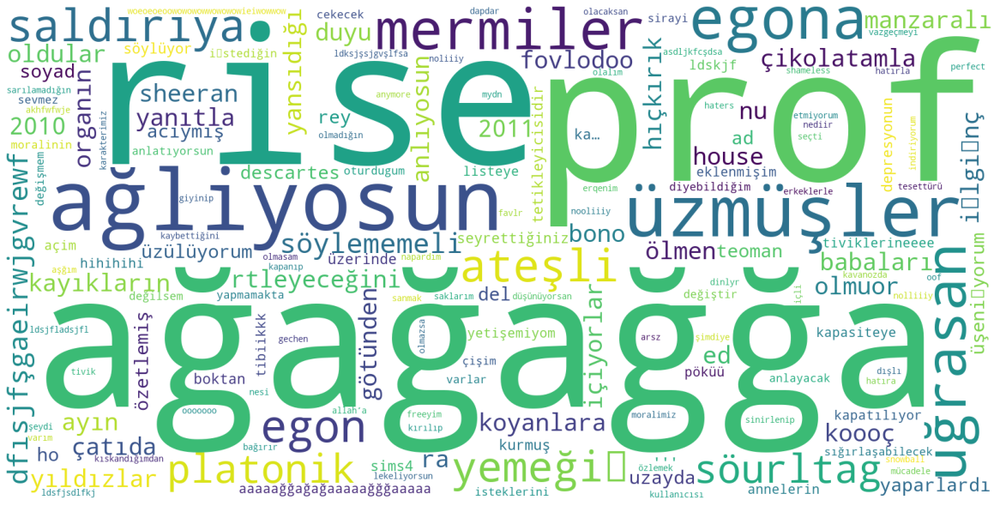

Language:  zh-TW


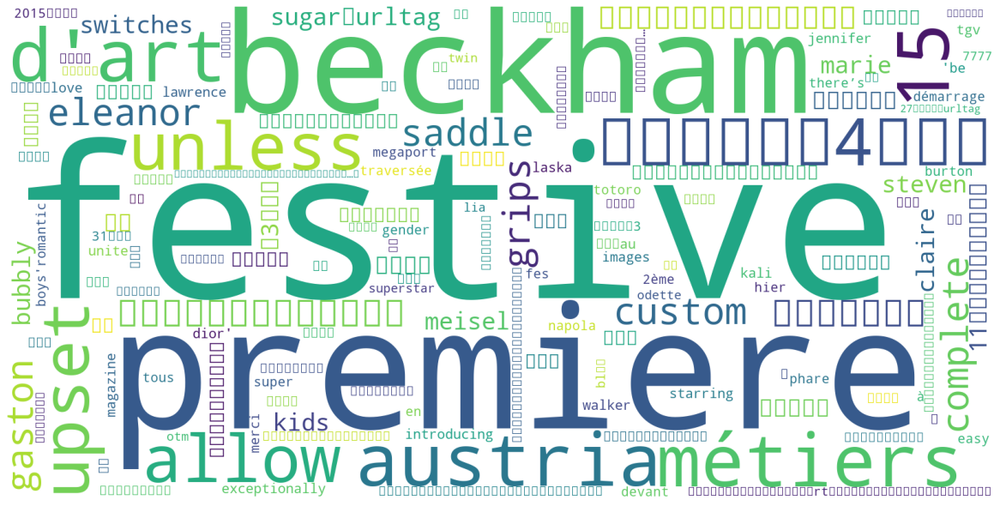

Language:  id


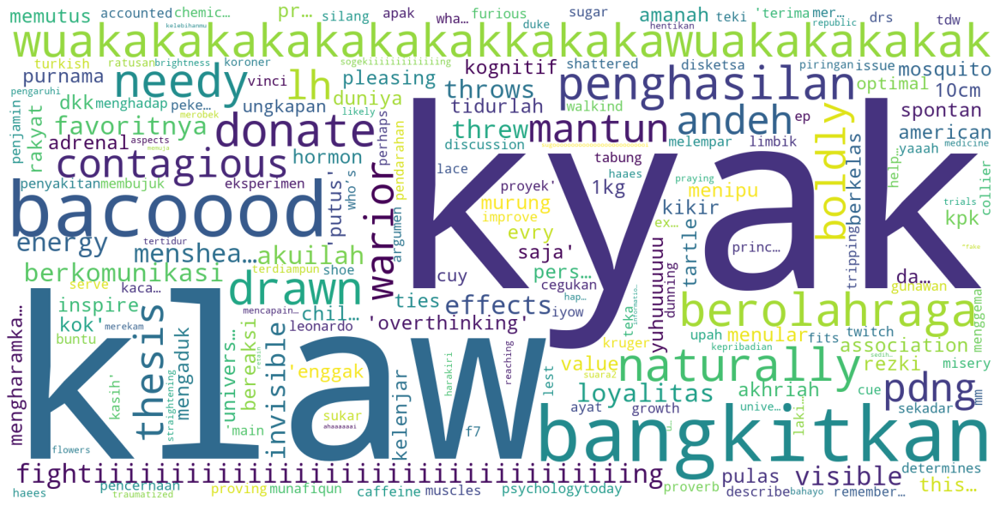

Language:  ko


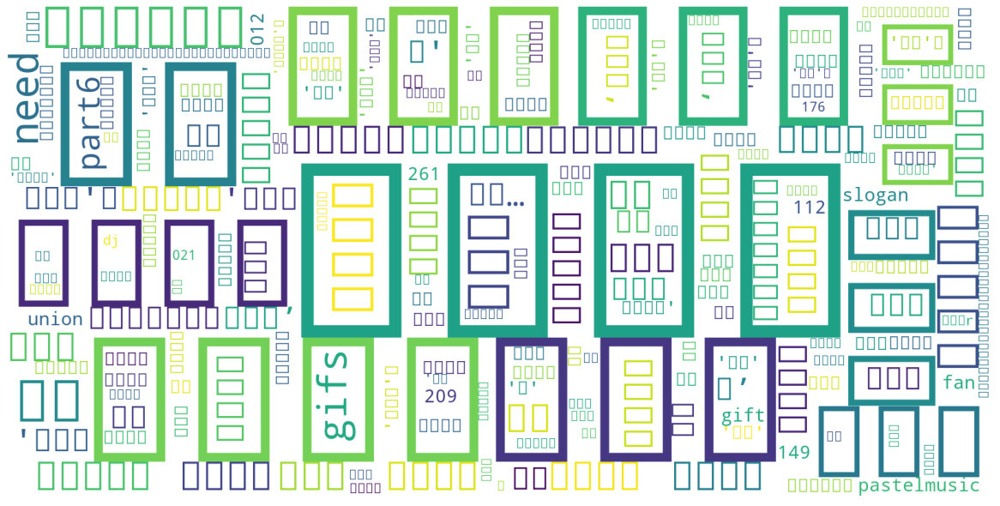

Language:  da


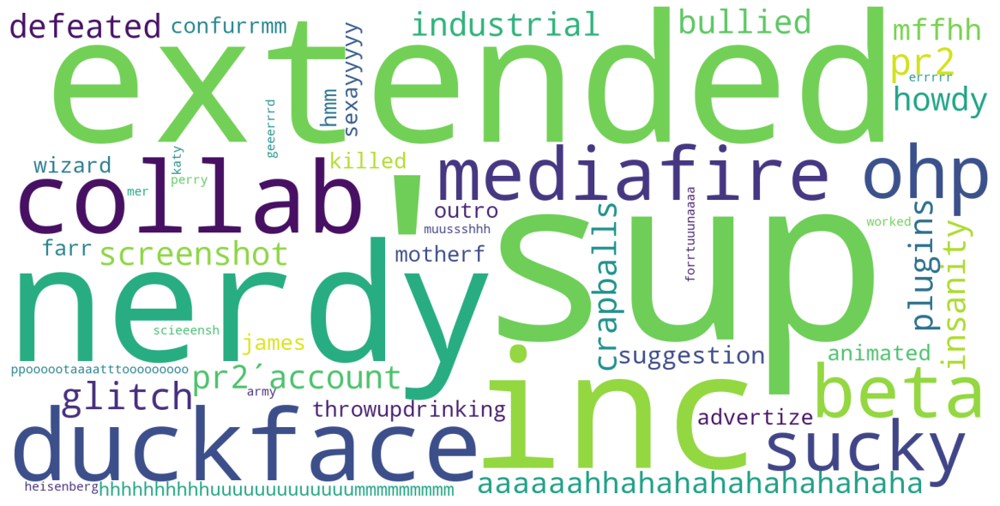

Language:  Select Language...


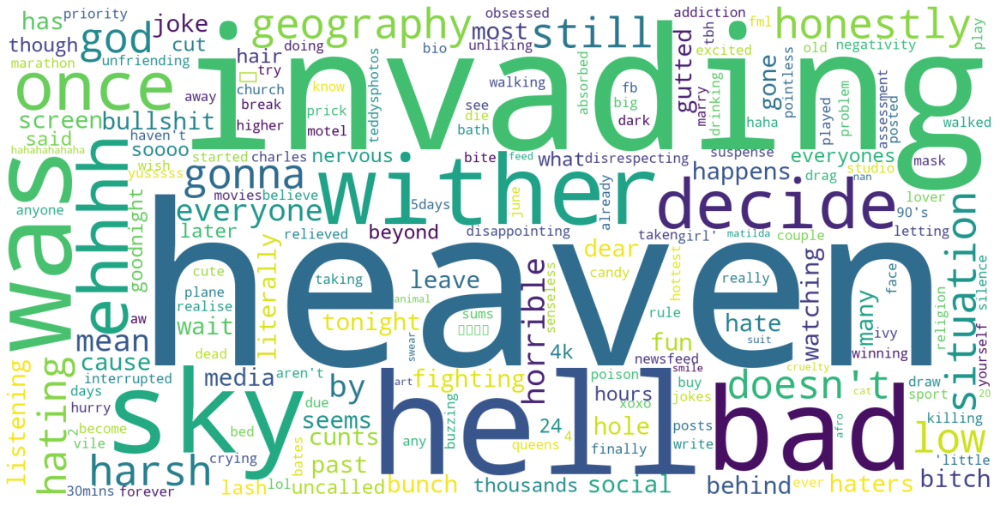

Language:  ar


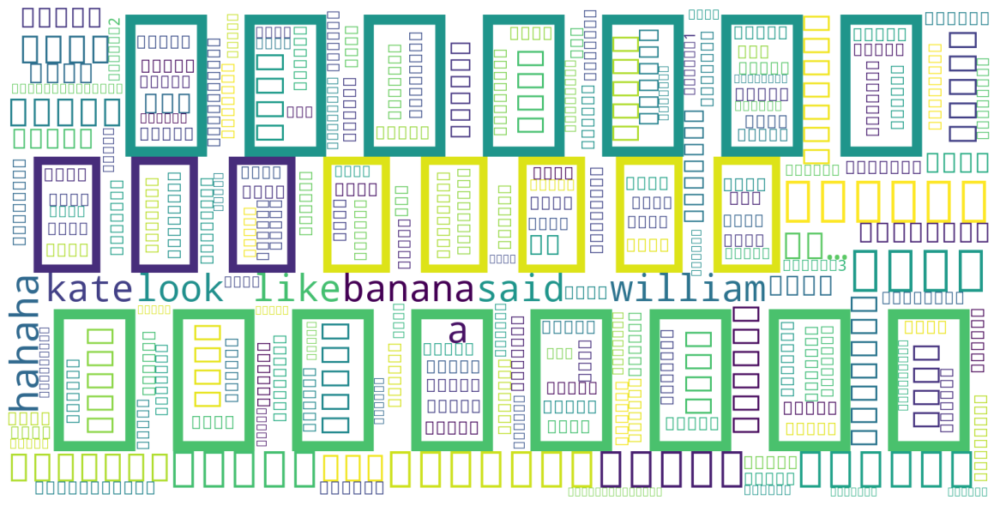

Language:  fil


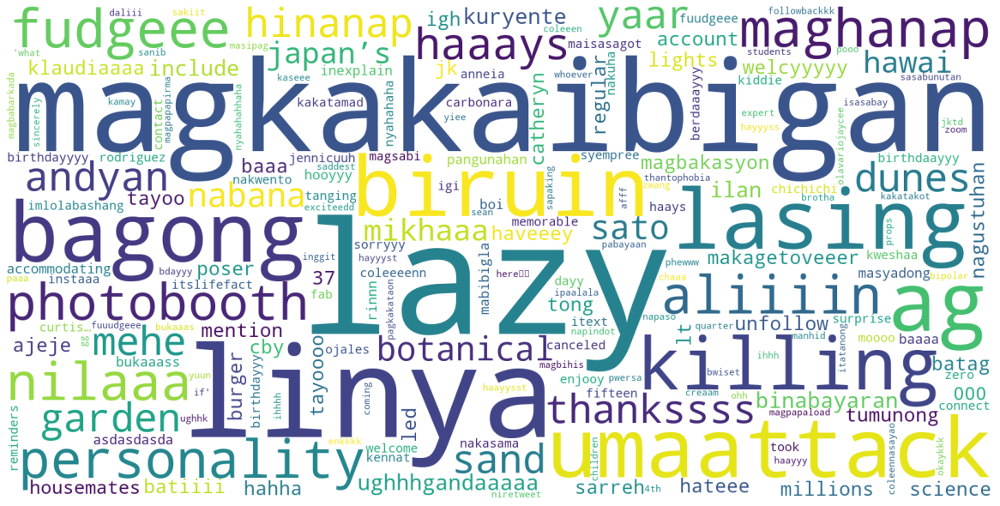

Language:  en-AU


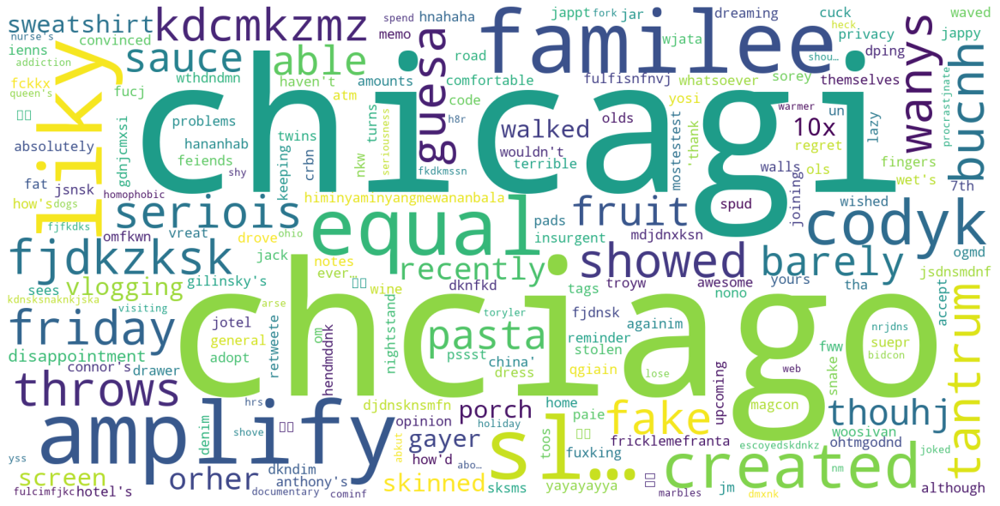

Language:  el


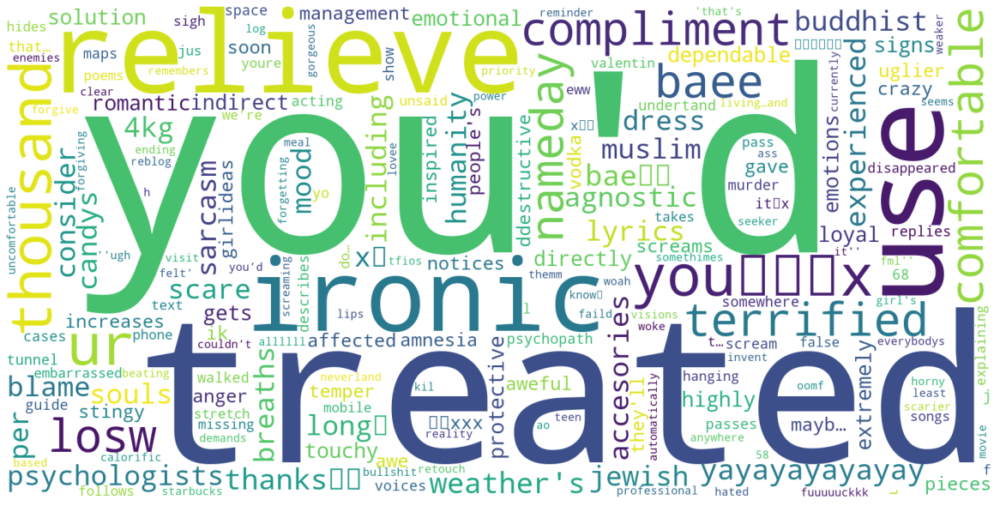

In [21]:
lang_series = df_tweet_lang['lang']
for lang in df_tweet_lang['lang'].unique():
    print('Language: ', lang)
    df = df_tweet_lang[lang_series == lang][["text"]]
    if df.shape[0] == 0: continue
    plot_wordcloud(
        df,
        outname = f"wcloud_{lang}"
    )

## Selected languages' word cloud between human and bot

In [25]:
# these languages have bot!
lang_series = df_tweet_lang['lang']
for lang in df_tweet_lang['lang'].unique():
    df = df_tweet_lang[lang_series == lang][["text","label"]]
    if df.shape[0] == 0: continue
    df_bot, df_human = split_by_label(df)
    if df_bot.shape[0] > 0 and df_human.shape[0] > 0:
        print('Language: ', lang)
        print('bot/human',df_bot.shape, df_human.shape)

Language:  en
bot/human (2018169, 2) (7681987, 2)
Language:  de
bot/human (3198, 2) (14825, 2)
Language:  ja
bot/human (3212, 2) (69929, 2)
Language:  ru
bot/human (111, 2) (3405, 2)
Language:  nl
bot/human (3061, 2) (13315, 2)
Language:  en-gb
bot/human (2519, 2) (126347, 2)
Language:  pt
bot/human (793, 2) (36096, 2)


------------------------------
Language:  en
Bot W.Cloud


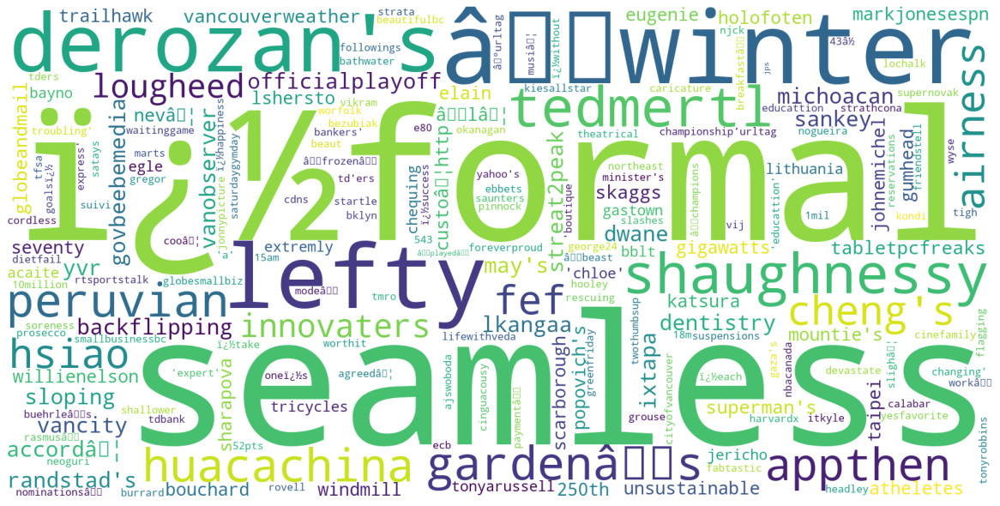

Human W.Cloud


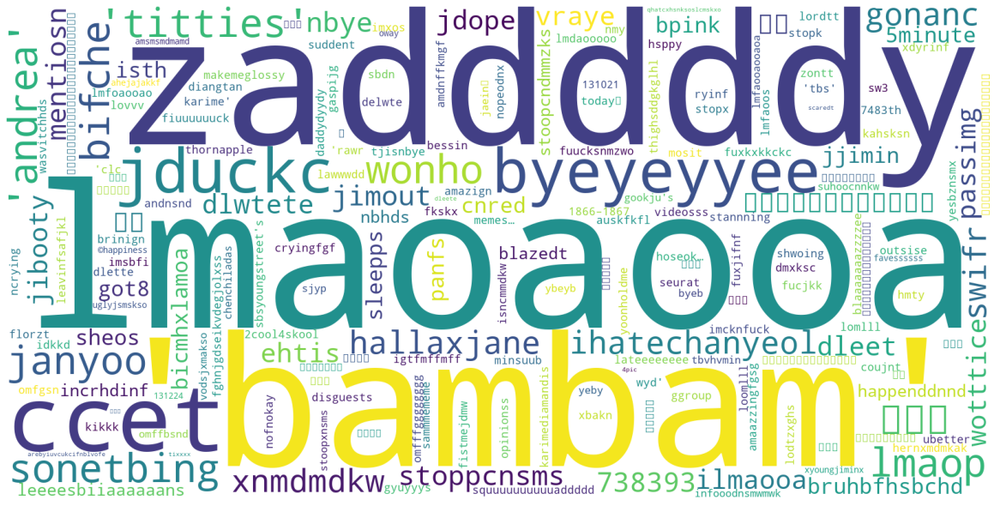

------------------------------
Language:  de
Bot W.Cloud


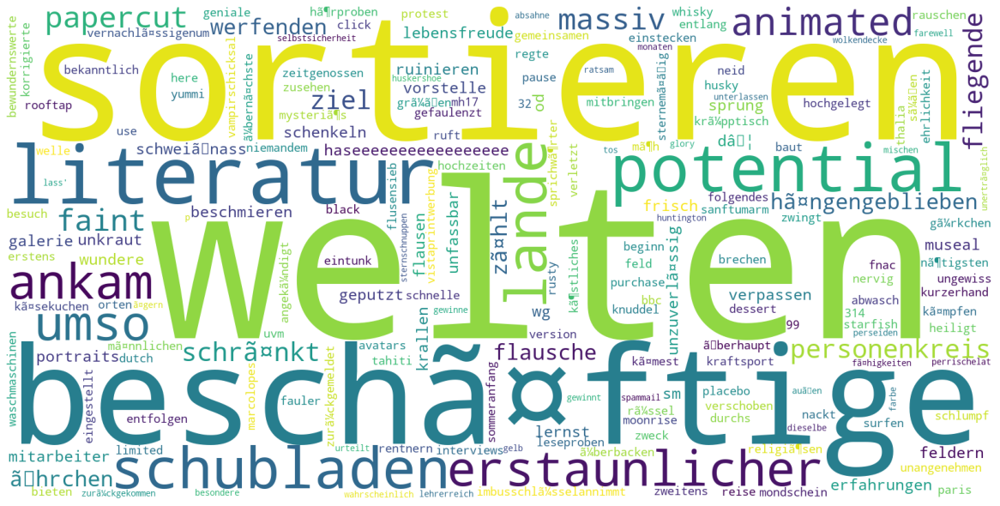

Human W.Cloud


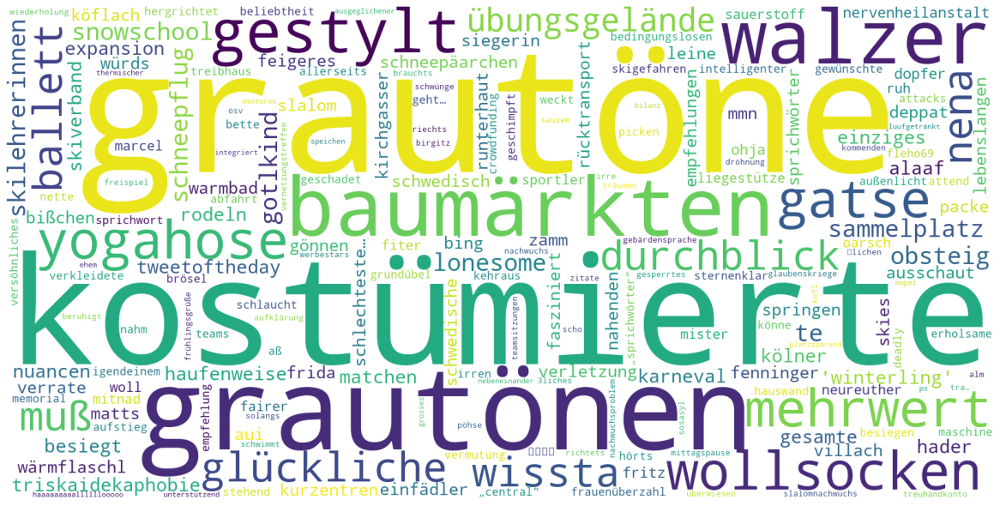

------------------------------
Language:  ru
Bot W.Cloud


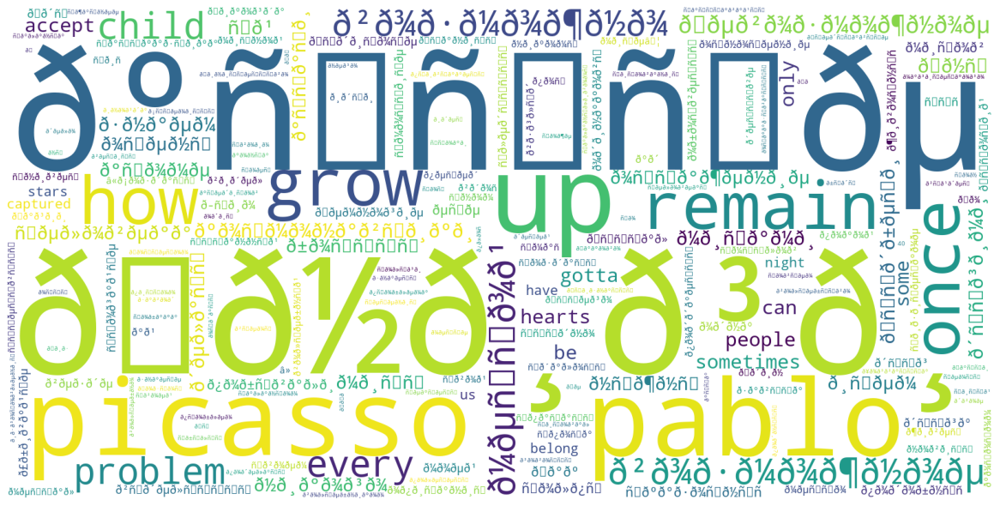

Human W.Cloud


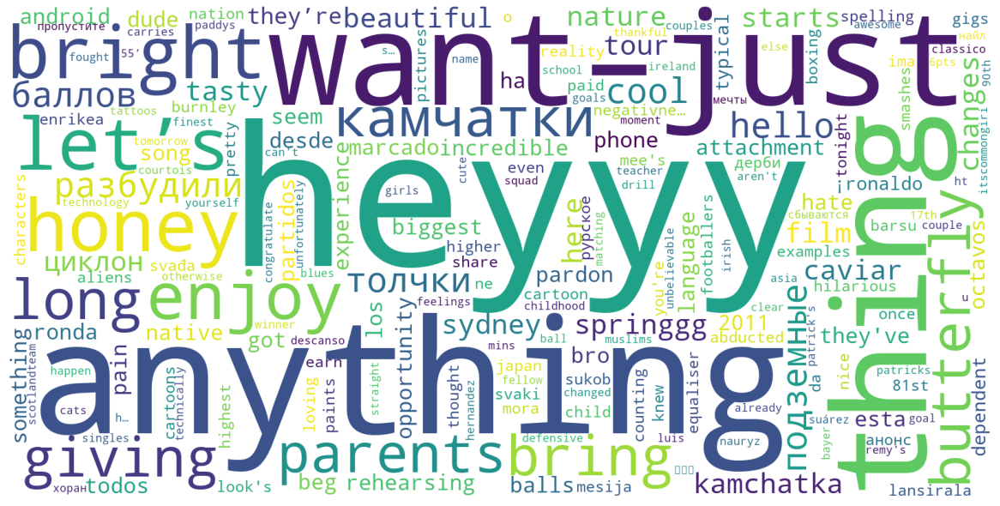

In [27]:
selected_languages = ['en', 'de', 'ru']
for lang in selected_languages:
    print('------------------------------')
    print('Language: ', lang)
    df = df_tweet_lang[lang_series == lang][["text","label"]]
    df_bot, df_human = split_by_label(df)
    print('Bot W.Cloud')
    plot_wordcloud(
        df_bot,
        outname = f"wcloud_{lang}_bot"
    )
    print('Human W.Cloud')
    plot_wordcloud(
        df_human,
        outname = f"wcloud_{lang}_human"
    )

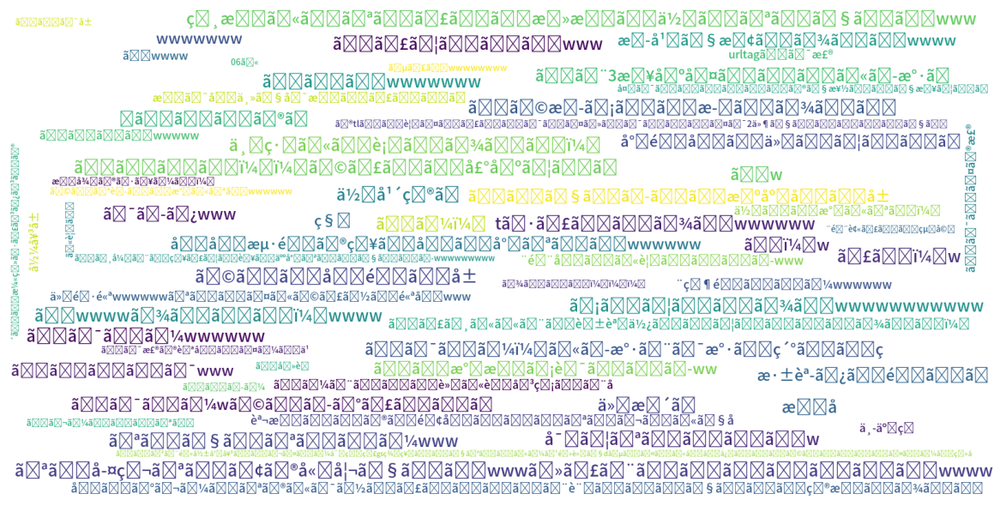

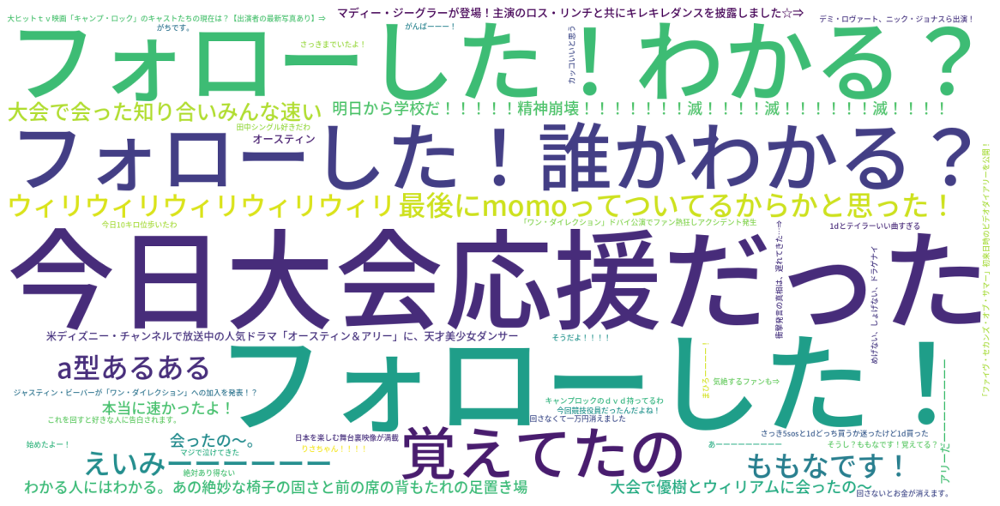

In [31]:
    # tokenize
    def plot_jp(df, outname):

        tokenizer = tf.keras.preprocessing.text.Tokenizer()
        tokenizer.fit_on_texts(df["text"])

        # gen wcloud
        font = './font/NotoSansJP-Medium.otf'
        word_index = tokenizer.__dict__['word_index']
        wordcloud = WordCloud(width = 1600, height = 800,
                        background_color ='white',
                        stopwords = stopwords,
                        min_font_size = 10,
                        font_path=font).generate_from_frequencies(word_index)
        
        # plot the WordCloud image                      
        plt.figure(figsize = (16, 8), facecolor = None)
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.tight_layout(pad = 0)
        if save_fig: plt.savefig(output_path(outname), dpi=dpi)
        plt.show()

    df = df_tweet_lang[lang_series == 'ja'][["text","label"]]
    df_bot, df_human = split_by_label(df)
    plot_jp(df_bot, f'wcloud_ja_bot')
    plot_jp(df_human, f'wcloud_ja_human')

# Other stats

In [33]:
meta = pipe.dfs['tweet_metadata_df']
meta.head(1)
meta.shape
meta.columns

,id,id_,source,user_id,truncated,in_reply_to_status_id,in_reply_to_user_id,in_reply_to_screen_name,retweeted_status_id,geo,...,retweeted,possibly_sensitive,num_hashtags,num_urls,num_mentions,created_at,timestamp,crawled_at,updated,label
0,24858289,532627591686275072,"<a href=""http://www.facebook.com/twitter"" rel=...",24858289,NaN,0,0,NaN,0,NaN,...,NaN,NaN,0,1,0,Wed Nov 12 20:14:48 +0000 2014,2014-11-12 21:14:48,2014-11-12 21:44:09,2014-11-12 21:44:09,1


(11979749, 26)

Index(['id', 'id_', 'source', 'user_id', 'truncated', 'in_reply_to_status_id',
       'in_reply_to_user_id', 'in_reply_to_screen_name', 'retweeted_status_id',
       'geo', 'place', 'contributors', 'retweet_count', 'reply_count',
       'favorite_count', 'favorited', 'retweeted', 'possibly_sensitive',
       'num_hashtags', 'num_urls', 'num_mentions', 'created_at', 'timestamp',
       'crawled_at', 'updated', 'label'],
      dtype='object')

In [34]:
meta_grouped = meta.groupby('user_id').sum().reset_index()[[
    'user_id', 'retweet_count', 'reply_count', 'favorite_count', 
    'num_hashtags', 'num_urls', 'num_mentions'
]].merge(df_user[['id', 'label']], left_on='user_id', right_on='id')
meta_grouped.head()
meta_grouped['label'].unique()

,user_id,retweet_count,reply_count,favorite_count,num_hashtags,num_urls,num_mentions,id,label
0,678033,242725,0,1676,1177,951,3556,678033,0
1,722623,908396,0,1303,1154,523,2279,722623,0
2,755116,105864,0,522,129,397,3078,755116,0
3,755746,644062,0,276,873,1493,2206,755746,0
4,785080,139956,0,1662,168,207,2531,785080,0


array([0, 1], dtype=int64)

In [35]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 13
EXTRA_SIZE = 15
ULTRA_SIZE = 20

plt.rc('font', size=12)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

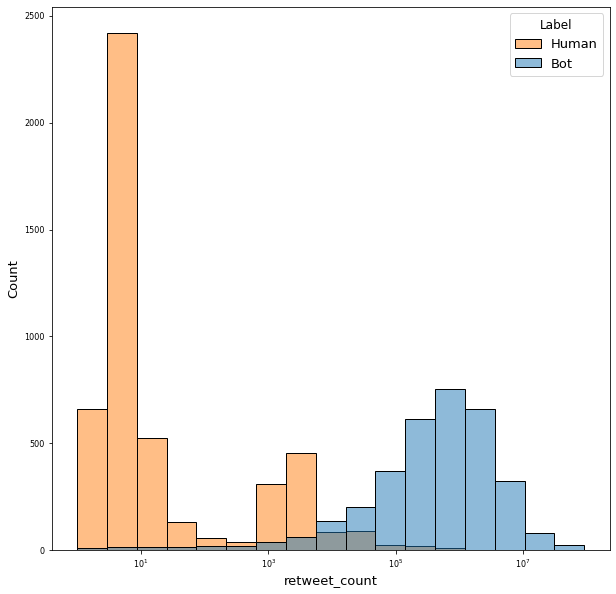

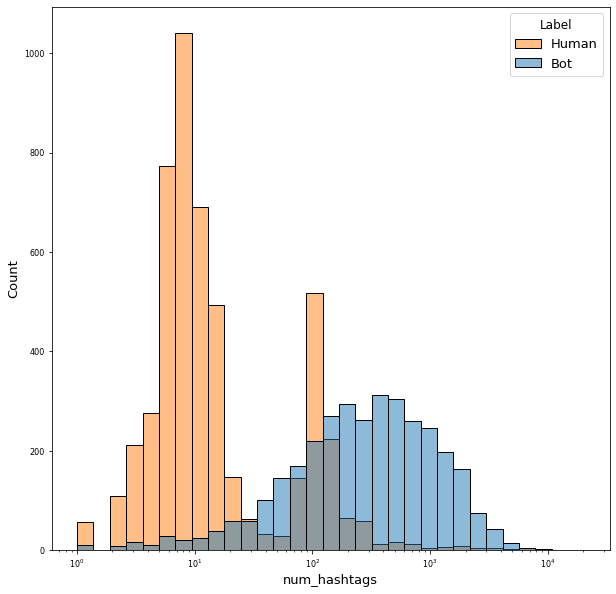

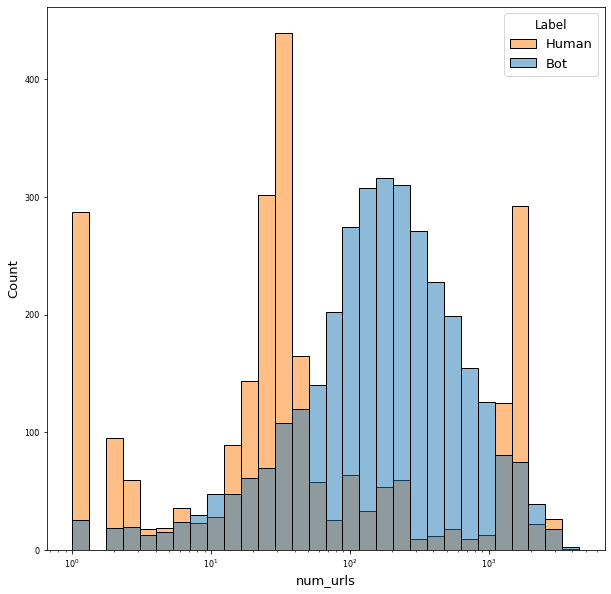

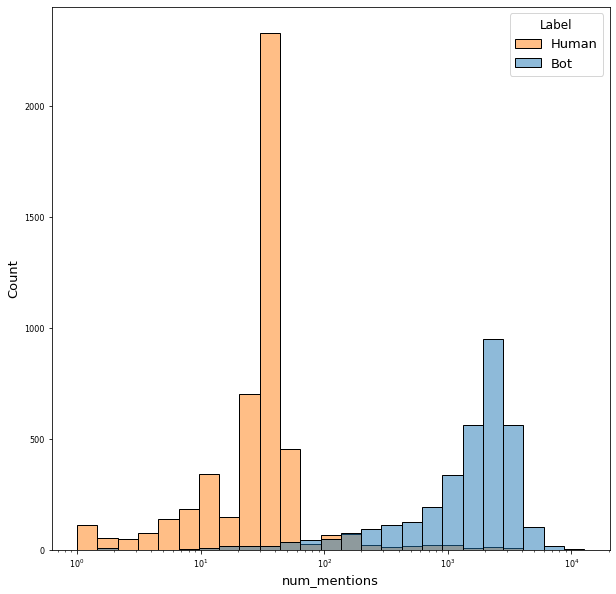

In [37]:
def plot_log_hist(feature):
    figure = plt.figure(figsize=(10,10))

    test = meta_grouped[meta_grouped[feature] > 0.0]
    sns.histplot(data=test, x=feature, hue='label', log_scale=True)

    figure.patch.set_facecolor('white')
    # plt.suptitle(f'Histogram {feature} bot vs human')
    plt.legend(title='Label', labels=['Human', 'Bot'])
    if save_fig: plt.savefig(output_path(f'{feature}_hist'), dpi=dpi)
    plt.show()
feature_list = [
    'retweet_count', 
    # 'reply_count', 
    # 'favorite_count', 
    'num_hashtags', 'num_urls', 'num_mentions'
]
for i, feature in enumerate(feature_list):
    plot_log_hist(feature)